In [2]:
import pandas as pd
import time

# 读取CSV文件
df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv")

# 转换数据为二维数组
data = df.values
data

array([[ -60.042149,  -80.474419,  -80.90625 , ...,  136.447739,
         116.331291,  125.436501],
       [ -86.135048, -109.615067, -111.55468 , ...,  -33.735893,
         -52.657543,  -38.772579],
       [-280.149109, -307.533569, -321.570648, ...,   28.051859,
          12.142269,   21.863974],
       ...,
       [ -92.405586, -111.268562, -113.206528, ...,  -20.002447,
         -36.376289,  -18.921453],
       [-102.464012, -124.390778, -132.975616, ...,  -24.637737,
         -31.2731  ,  -10.237212],
       [-284.382324, -304.590271, -311.970276, ...,   -3.610749,
         -12.316369,    7.16364 ]])

In [8]:
# 计算时间间隔
interval = 1 / 128

# 模拟数据的采样速度发送
last_timestamp = time.time()
for row in data:
    # 发送数据
    # print(row)
    # 计算实际的时间间隔
    current_timestamp = time.time()
    actual_interval = current_timestamp - last_timestamp
    last_timestamp = current_timestamp

    # 等待时间间隔，模拟数据的采样速度
    # time.sleep(interval - actual_interval)
    time.sleep(interval)
    print("actual_interval: ", actual_interval)


actual_interval:  0.0
actual_interval:  0.011776208877563477
actual_interval:  0.015019893646240234
actual_interval:  0.015292882919311523
actual_interval:  0.01559758186340332
actual_interval:  0.01585102081298828
actual_interval:  0.016009807586669922
actual_interval:  0.015941858291625977
actual_interval:  0.023000240325927734
actual_interval:  0.022316455841064453
actual_interval:  0.01757669448852539
actual_interval:  0.01527857780456543
actual_interval:  0.01378774642944336
actual_interval:  0.01483464241027832
actual_interval:  0.018564224243164062
actual_interval:  0.012781143188476562
actual_interval:  0.01655125617980957
actual_interval:  0.015521764755249023
actual_interval:  0.021768808364868164
actual_interval:  0.009233474731445312
actual_interval:  0.01588129997253418
actual_interval:  0.015535116195678711
actual_interval:  0.01600170135498047
actual_interval:  0.015960216522216797
actual_interval:  0.019547224044799805
actual_interval:  0.013530731201171875
actual_inter

<IPython.core.display.Javascript object>


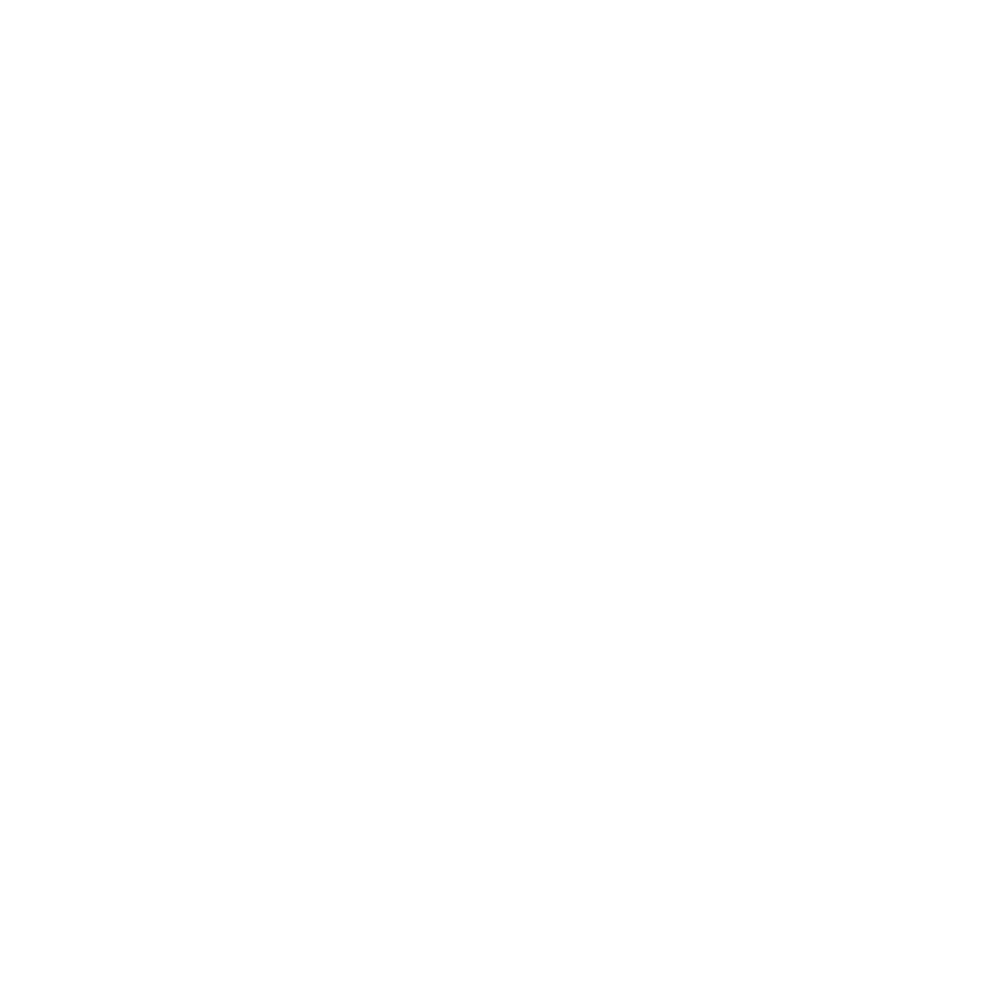

<IPython.core.display.Javascript object>


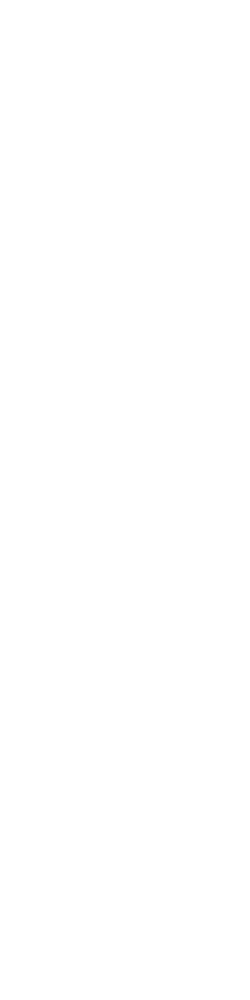

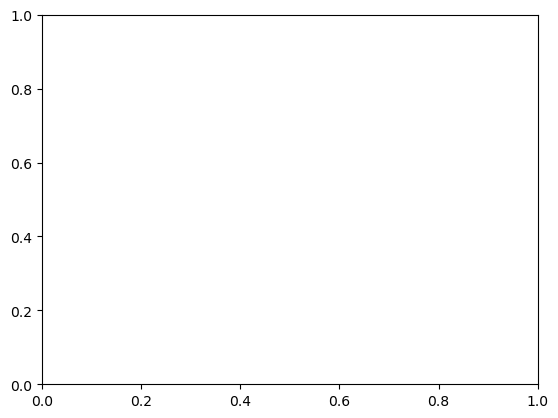

In [78]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import pandas as pd
%matplotlib notebook
%matplotlib inline

# 读取CSV文件
df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv")

# 创建一个Figure对象和一个Axes对象
fig, ax = plt.subplots()

# 定义一个函数，用于在动画中更新数据
def update(i):
    # 清除Axes对象
    ax.clear()
    # 绘制新的数据
    ax.plot(df.iloc[0,0+i:1000+i], df.iloc[1,0+i:1000+i])
    # 设置标题和坐标轴标签
    ax.set_title('Waveform')
    ax.set_xlabel('Time')
    ax.set_ylabel('Value')

# 创建动画对象
ani = animation.FuncAnimation(fig, update, frames=len(df), interval=50)

# 显示动画
plt.show()


<IPython.core.display.Javascript object>


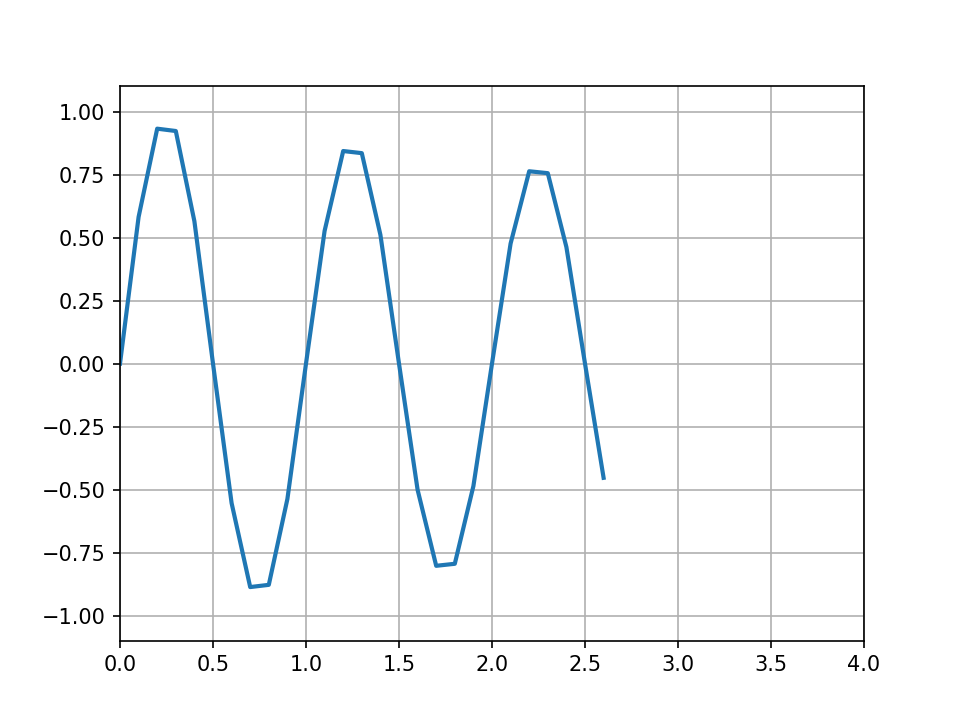

In [6]:
import itertools

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
%matplotlib notebook

def data_gen():
    for cnt in itertools.count():
        t = cnt / 10
        yield t, np.sin(2*np.pi*t) * np.exp(-t/10.)


def init():
    ax.set_ylim(-1.1, 1.1)
    ax.set_xlim(0, 1)
    del xdata[:]
    del ydata[:]
    line.set_data(xdata, ydata)
    return line,

fig, ax = plt.subplots()
line, = ax.plot([], [], lw=2)
ax.grid()
xdata, ydata = [], []


def run(data):
    # update the data
    t, y = data
    xdata.append(t)
    ydata.append(y)
    xmin, xmax = ax.get_xlim()

    if t >= xmax:
        ax.set_xlim(xmin, 2*xmax)
        ax.figure.canvas.draw()
    line.set_data(xdata, ydata)

    return line,

# Only save last 100 frames, but run forever
anim = animation.FuncAnimation(fig, run, data_gen, interval=100, init_func=init,
                              save_count=100)
plt.show()

<IPython.core.display.Javascript object>


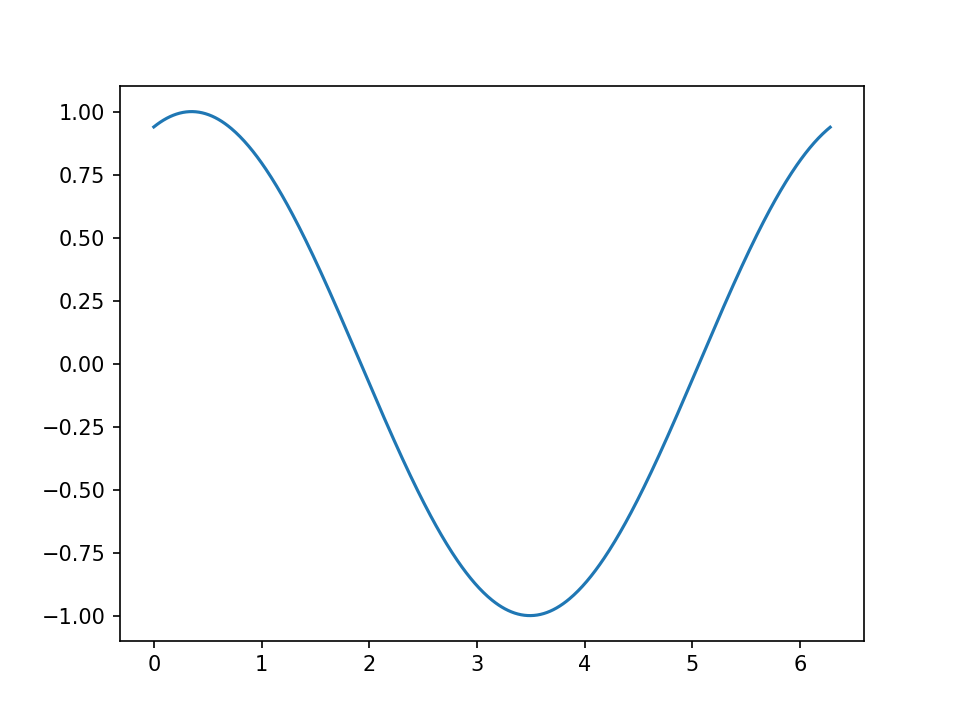

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
%matplotlib notebook

fig, ax = plt.subplots()

x = np.arange(0, 2*np.pi, 0.01)
line, = ax.plot(x, np.sin(x))


def animate(i):
    line.set_ydata(np.sin(x + i / 50))  # update the data.
    return line,


ani = animation.FuncAnimation(
    fig, animate, interval=20, blit=True, save_count=50)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")
#
# or
#
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

plt.show()

<IPython.core.display.Javascript object>


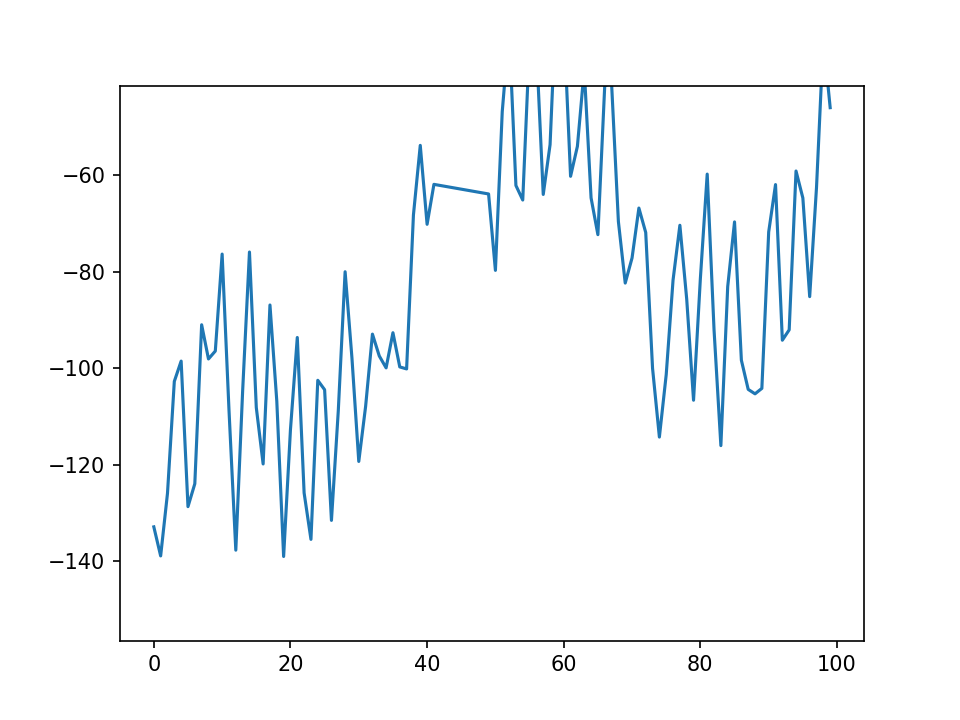

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
%matplotlib notebook
# %matplotlib inline

fig, ax = plt.subplots()
df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv",header=None)

#x = np.arange(0, 2*np.pi, 0.01)
x = df.iloc[0,:100]
#line, = ax.plot(x, np.sin(x))
line, = ax.plot(x,df.iloc[1,:100])

def animate(i):
    #x.set_xdata(df.iloc[0,0+i:100+i])
    line.set_ydata(df.iloc[1,0+i:100+i])  # update the data.
    return line,


ani = animation.FuncAnimation(
    fig, animate, interval=20, blit=True, save_count=50)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")
#
# or
#
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

plt.show()

<IPython.core.display.Javascript object>


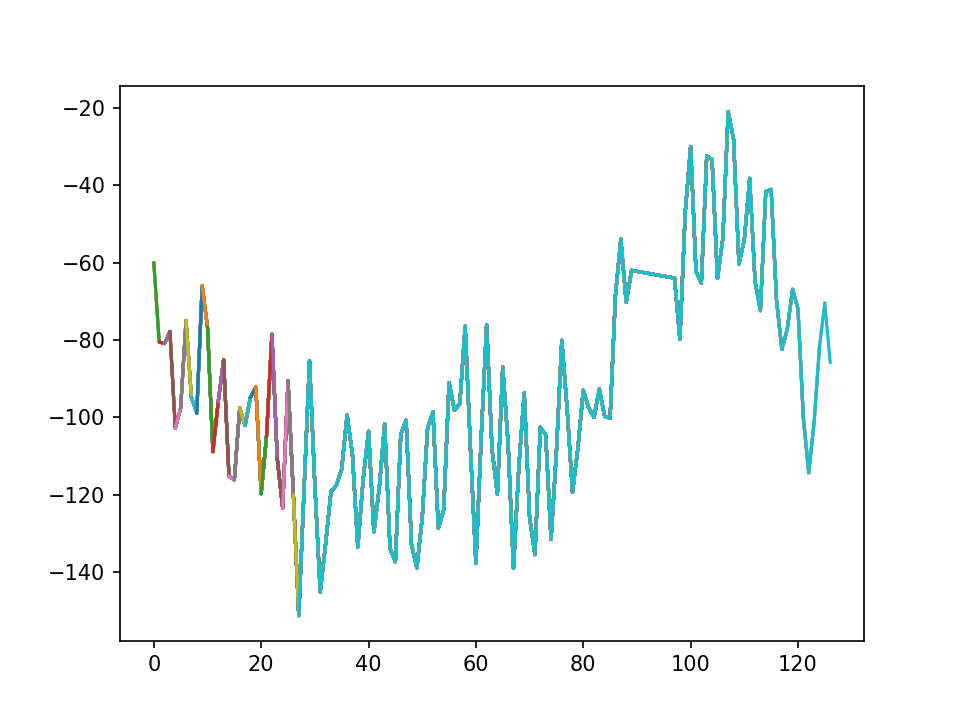

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
%matplotlib notebook
# %matplotlib inline

fig, ax = plt.subplots()
df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv",header=None)

#x = np.arange(0, 2*np.pi, 0.01)
x = df.iloc[0,:100]
#line, = ax.plot(x, np.sin(x))
line, = ax.plot(x,df.iloc[1,:100])

def animate(i):
    #x.set_xdata(df.iloc[0,0+i:100+i])
    x = df.iloc[0,0+i:100+i]
    line, = ax.plot(x,df.iloc[1,0+i:100+i])  # update the data.
    return line,


ani = animation.FuncAnimation(
    fig, animate, interval=2, blit=True, save_count=50)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")
#
# or
#
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

plt.show()

## 横轴纵轴皆移动

<IPython.core.display.Javascript object>


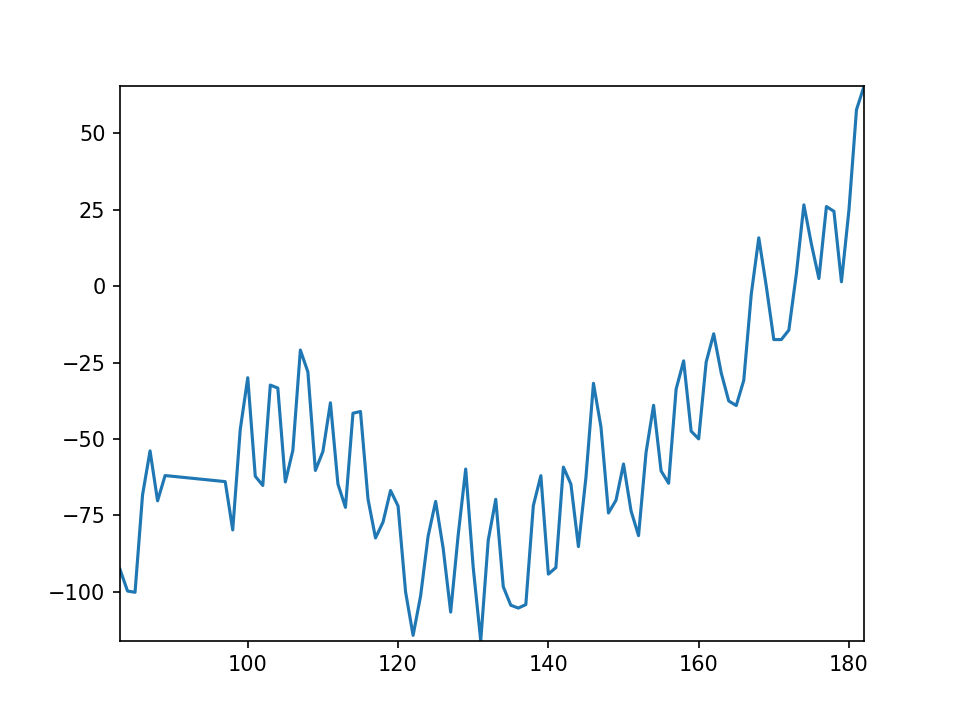

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
%matplotlib notebook
# %matplotlib inline

fig, ax = plt.subplots()
df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv",header=None)

#x = np.arange(0, 2*np.pi, 0.01)
x = df.iloc[0,:100]
#line, = ax.plot(x, np.sin(x))
line, = ax.plot(x,df.iloc[1,:100])

def animate(i):
    line.set_xdata(df.iloc[0,0+i:100+i])
    line.set_ydata(df.iloc[1,0+i:100+i])  # update the data.
    
    ax.set_xlim(df.iloc[0,0+i:100+i].min(), df.iloc[0,0+i:100+i].max())
    ax.set_ylim(df.iloc[1,0+i:100+i].min(), df.iloc[1,0+i:100+i].max())
    
    return line,


ani = animation.FuncAnimation(
    fig, animate, interval=20, blit=True, save_count=50)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")
#
# or
#
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

plt.show()

## 只移动时间轴 

# 小窗

<IPython.core.display.Javascript object>


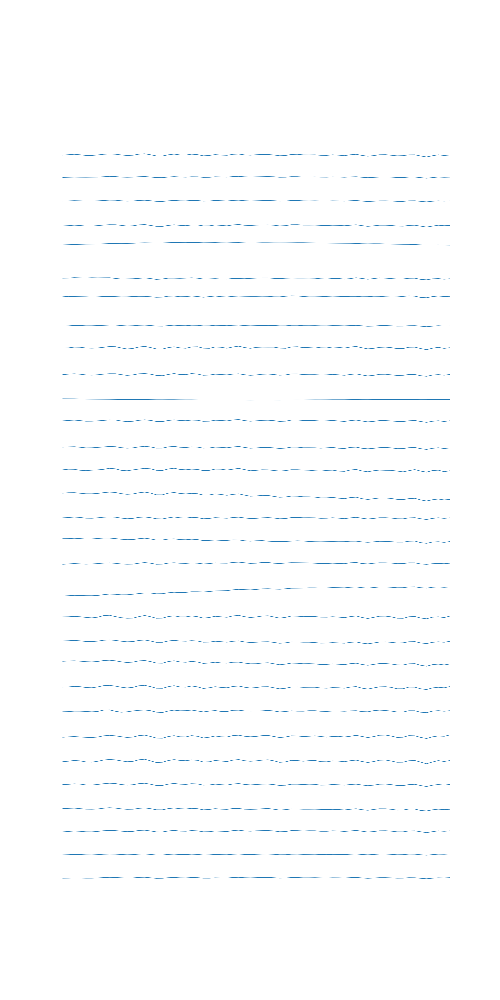

ValueError: Axis limits cannot be NaN or Inf

In [58]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
%matplotlib notebook
# %matplotlib inline

fig, axs = plt.subplots(nrows=32, figsize=(20,40),sharex=True)
# plt.subplots_adjust(hspace=-0.5)

df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv",header=None)

x = df.iloc[0,:128]
lines = []
for i, ax in enumerate(axs):
    
    line, = ax.plot(x,df.iloc[i+1,:128])
    lines.append(line)
    ax.set_ylim(df.iloc[i+1,:].min(), df.iloc[i+1,:].max())
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    ax.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# fig.patch.set_facecolor('lightgray')
# fig.patch.set_linewidth(1)

def animate(i):
    for j ,line in enumerate(lines):
        line.set_xdata(df.iloc[0,0+i*100:128+i*100])
        line.set_ydata(df.iloc[j+1,0+i*100:128+i*100])  # update the data.
    
        ax.set_xlim(df.iloc[0,0+i*100:128+i*100].min(), df.iloc[0,0+i*100:128+i*100].max())
#         ax.set_ylim(df.iloc[j+1,i*100:128+i*100].min(), df.iloc[j+1,i*100:128+i*100].max())
    
    
    return lines


ani = animation.FuncAnimation(
    fig, animate, interval=1000, blit=True, save_count=500)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")
#
# or
#
writer = animation.FFMpegWriter(
    fps=1, metadata=dict(artist='Me'), bitrate=1800)
ani.save("minic.mp4", writer=writer)

plt.show()

## 横轴纵轴皆固定

<IPython.core.display.Javascript object>


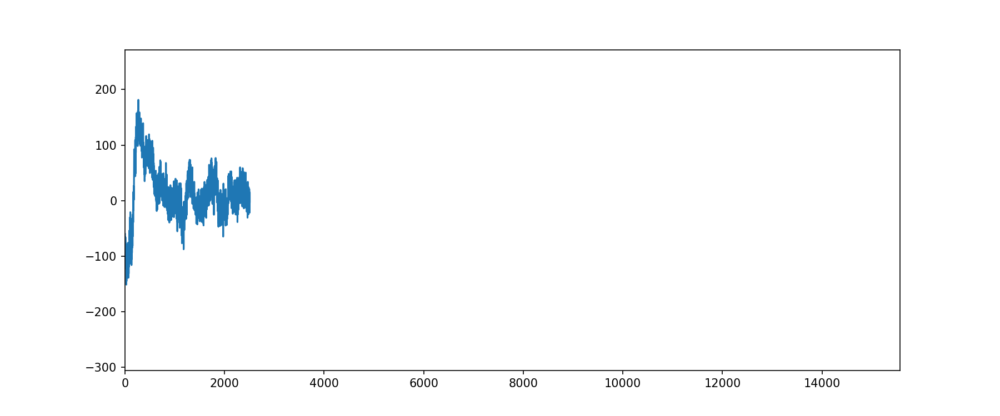

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
%matplotlib notebook
# %matplotlib inline

fig, ax = plt.subplots(figsize=(12, 5))
df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv",header=None)

#x = np.arange(0, 2*np.pi, 0.01)
x = df.iloc[0,:100]
#line, = ax.plot(x, np.sin(x))
line, = ax.plot(x,df.iloc[1,:100])
ax.set_ylim(df.iloc[1,:].min(), df.iloc[1,:].max())
ax.set_xlim(df.iloc[0,:].min(), df.iloc[0,:].max())
def animate(i):
    line.set_xdata(df.iloc[0,0:100+i])
    line.set_ydata(df.iloc[1,0:100+i])  # update the data.
    
    
    
    
    return line,


ani = animation.FuncAnimation(
    fig, animate, interval=20, blit=True, save_count=50)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")
#
# or
#
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

plt.show()

## 一次128数据点刷新

<IPython.core.display.Javascript object>


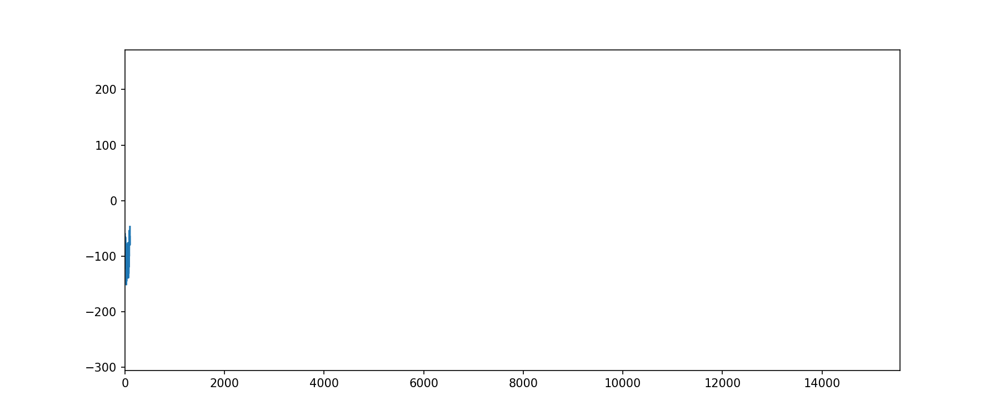

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
%matplotlib notebook
# %matplotlib inline

fig, ax = plt.subplots(figsize=(12, 5))
df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv",header=None)

#x = np.arange(0, 2*np.pi, 0.01)
x = df.iloc[0,:100]
#line, = ax.plot(x, np.sin(x))
line, = ax.plot(x,df.iloc[1,:100])
ax.set_ylim(df.iloc[1,:].min(), df.iloc[1,:].max())
ax.set_xlim(df.iloc[0,:].min(), df.iloc[0,:].max())
def animate(i):
    line.set_xdata(df.iloc[0,0:100+i*128])
    line.set_ydata(df.iloc[1,0:100+i*128])  # update the data.
    
    
    
    
    return line,


ani = animation.FuncAnimation(
    fig, animate, interval=1000, blit=True, save_count=1000)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")
#
# or
#
writer = animation.FFMpegWriter(
    fps=30, metadata=dict(artist='Me'), bitrate=1800)
ani.save("movie1.mp4", writer=writer)

plt.show()

<IPython.core.display.Javascript object>


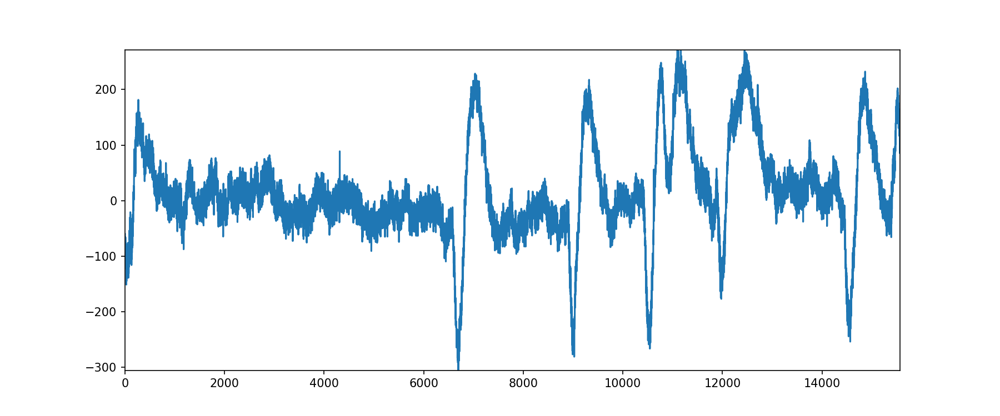

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
%matplotlib notebook
# %matplotlib inline

fig, ax = plt.subplots(figsize=(12, 5))
df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv",header=None)

#x = np.arange(0, 2*np.pi, 0.01)
x = df.iloc[0,:100]
#line, = ax.plot(x, np.sin(x))
line, = ax.plot(x,df.iloc[1,:100])
ax.set_ylim(df.iloc[1,:].min(), df.iloc[1,:].max())
ax.set_xlim(df.iloc[0,:].min(), df.iloc[0,:].max())
def animate(i):
    line.set_xdata(df.iloc[0,0:i])
    line.set_ydata(df.iloc[1,0:i])  # update the data.
    
    
    
    
    return line,


ani = animation.FuncAnimation(
    fig, animate, interval=1/128, blit=True, save_count=15000)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")
#
# or
#
writer = animation.FFMpegWriter(
    fps=30, metadata=dict(artist='Me'), bitrate=1800)
ani.save("movie1.mp4", writer=writer)

plt.show()

<IPython.core.display.Javascript object>


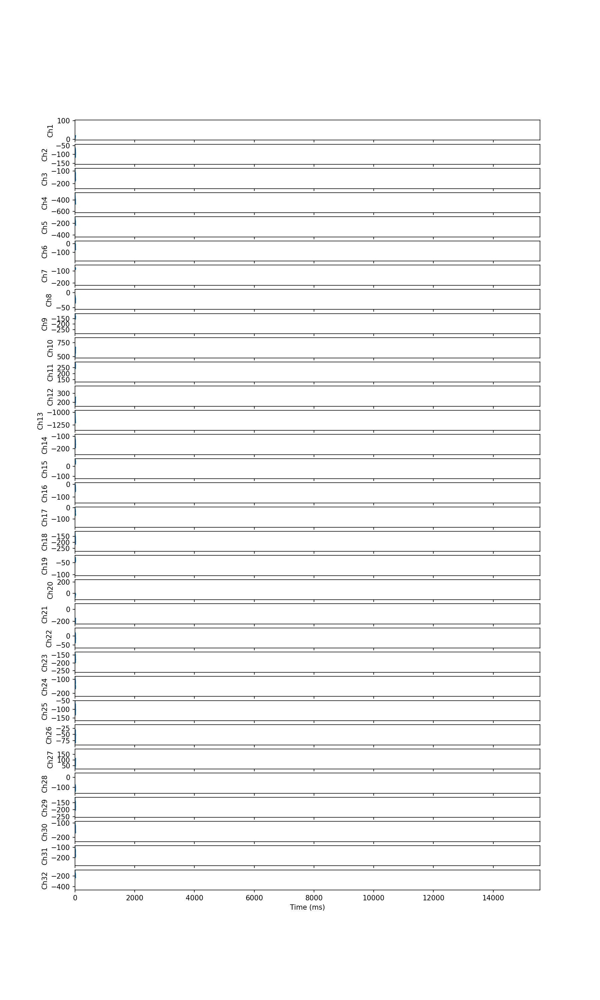

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation

%matplotlib notebook

fig, axs = plt.subplots(nrows=32, figsize=(12, 20), sharex=True)

df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv", header=None)

x = df.iloc[0,:100]

lines = []
for i, ax in enumerate(axs):
    line, = ax.plot(x, df.iloc[i,:100])
    lines.append(line)
    #ax.set_ylim(df.iloc[:,1:].min().min(), df.iloc[:,1:].max().max())
    ax.set_xlim(df.iloc[0,:].min(), df.iloc[0,:].max())
    ax.set_ylabel('Ch{}'.format(i+1))

axs[-1].set_xlabel('Time (ms)')

def animate(i):
    for j, line in enumerate(lines):
        line.set_xdata(df.iloc[0,0:i])
        line.set_ydata(df.iloc[j,0:i])
    return lines

ani = animation.FuncAnimation(fig, animate, interval=1/128, blit=True, save_count=15000)

# writer = animation.FFMpegWriter(fps=30, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie3.mp4", writer=writer)

plt.show()


<IPython.core.display.Javascript object>


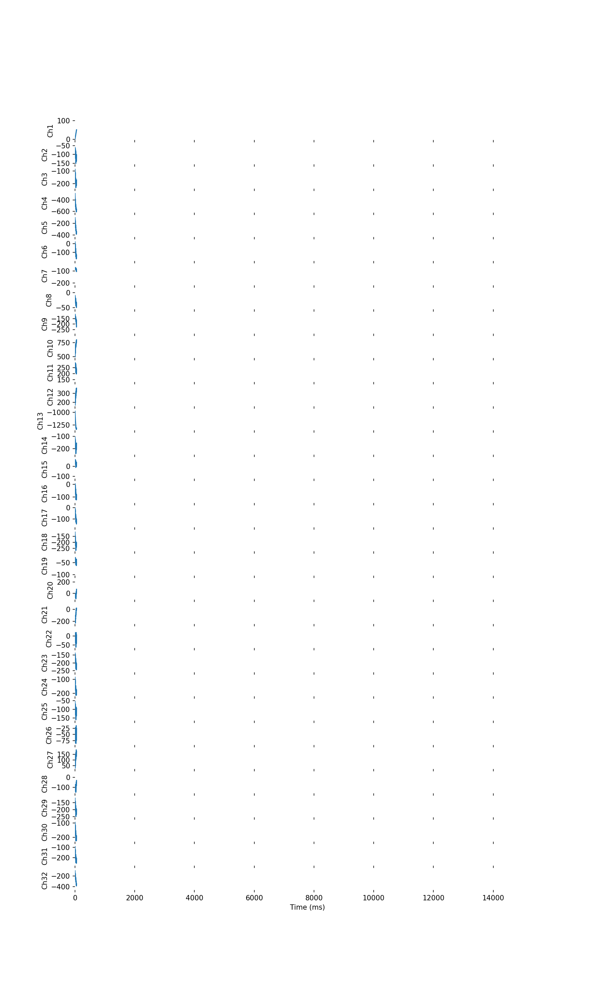

KeyboardInterrupt: 

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation

%matplotlib notebook

fig, axs = plt.subplots(nrows=32, figsize=(12, 20), sharex=True, subplot_kw=dict(frameon=False))

df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv", header=None)

x = df.iloc[0,:100]

lines = []
for i, ax in enumerate(axs):
    line, = ax.plot(x, df.iloc[i,:100])
    lines.append(line)
    #ax.set_ylim(df.iloc[:,1:].min().min(), df.iloc[:,1:].max().max())
    ax.set_xlim(df.iloc[0,:].min(), df.iloc[0,:].max())
    ax.set_ylabel('Ch{}'.format(i+1))

axs[-1].set_xlabel('Time (ms)')

def animate(i):
    for j, line in enumerate(lines):
        line.set_xdata(df.iloc[0,0:i])
        line.set_ydata(df.iloc[j,0:i])
    return lines

ani = animation.FuncAnimation(fig, animate, interval=1/128, blit=True, save_count=15000)

writer = animation.FFMpegWriter(fps=30, metadata=dict(artist='Me'), bitrate=1800)
ani.save("movie4.mp4", writer=writer)

#plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
%matplotlib notebook
# %matplotlib inline

fig, ax = plt.subplots(figsize=(12, 5))
df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv",header=None)

#x = np.arange(0, 2*np.pi, 0.01)
x = df.iloc[0,:600]
#line, = ax.plot(x, np.sin(x))
line, = ax.plot(x,df.iloc[1,:600])

def animate(i):
    line.set_xdata(df.iloc[0,0+i:600+i])
    line.set_ydata(df.iloc[1,0+i:600+i])  # update the data.
    
    ax.set_xlim(df.iloc[0,0+i:600+i].min(), df.iloc[0,0+i:600+i].max())
    ax.set_ylim(df.iloc[1,0+i:600+i].min(), df.iloc[1,0+i:600+i].max())
    
    return line,


ani = animation.FuncAnimation(
    fig, animate, interval=1/128, blit=True, cache_from_data= Flase)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")
#
# or
#
writer = animation.FFMpegWriter(
    fps=30, metadata=dict(artist='Me'), bitrate=1800)
ani.save("movie.mp4", writer=writer)



plt.show()

<IPython.core.display.Javascript object>


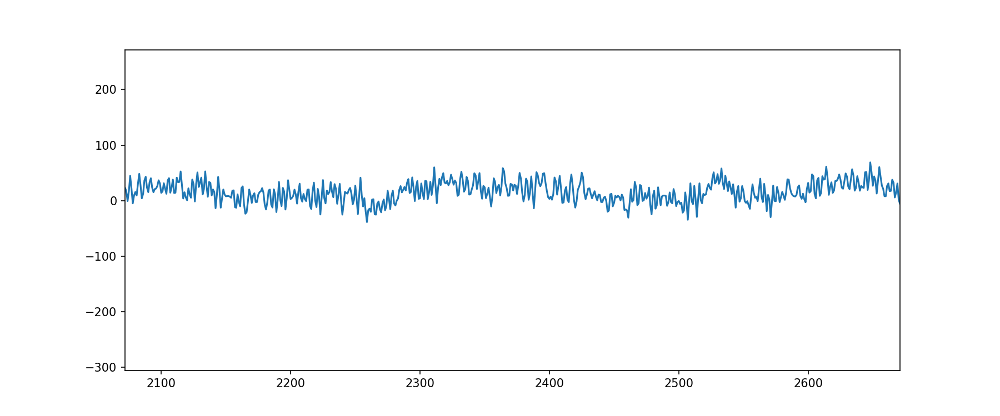

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
%matplotlib notebook
# %matplotlib inline

fig, ax = plt.subplots(figsize=(12, 5))
df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv",header=None)

#x = np.arange(0, 2*np.pi, 0.01)
x = df.iloc[0,:600]
#line, = ax.plot(x, np.sin(x))
line, = ax.plot(x,df.iloc[1,:600])

ax.set_ylim(df.iloc[1,:].min(), df.iloc[1,:].max())

def animate(i):
    line.set_xdata(df.iloc[0,0:600+i])
    line.set_ydata(df.iloc[1,0:600+i])  # update the data.
    ax.set_xlim(df.iloc[0,i:600+i].min(), df.iloc[0,i:600+i].max())
    
    return line,


ani = animation.FuncAnimation(
    fig, animate, interval=1, blit=True, save_count=50)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")

# or

writer = animation.FFMpegWriter(
    fps=30, metadata=dict(artist='Me'), bitrate=1800)
ani.save("movie.mp4", writer=writer)



plt.show()

<IPython.core.display.Javascript object>


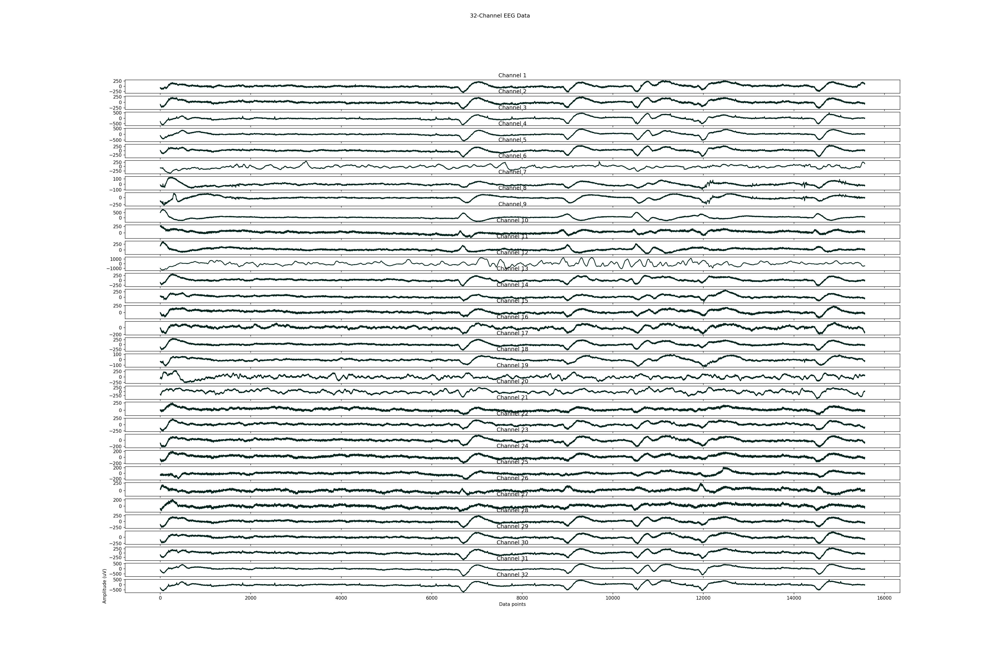

In [21]:
df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv",header=None)
# 创建32个子图
fig, axs = plt.subplots(32, figsize=(30, 20))
# fig, axs = plt.subplots(32)
hex_green = '#00251C'
#hex_orange = '#f56842'
# 绘制每个子图
for i in range(32):
    axs[i].plot(df.iloc[i+1,:],hex_green)
    axs[i].set_title(f'Channel {i+1}')


# 添加标题和轴标签
fig.suptitle('32-Channel EEG Data')
plt.xlabel('Data points')
plt.ylabel('Amplitude (uV)')

# 调整子图之间的间距和边距
#plt.subplots_adjust(hspace=2)
#plt.savefig("raw_eeg.png", dpi=500, bbox_inches='tight')
plt.savefig("channel_eeg.png", dpi=500, bbox_inches='tight')
plt.show()

In [ ]:
rect = patches.Rectangle((0, df.iloc[i+1,:].min()), 128, df.iloc[i+1,:].max()-df.iloc[i+1,:].min(), linewidth=1, edgecolor='none', facecolor='gray', alpha=0.3)
    axs[i].add_patch(rect)

<IPython.core.display.Javascript object>


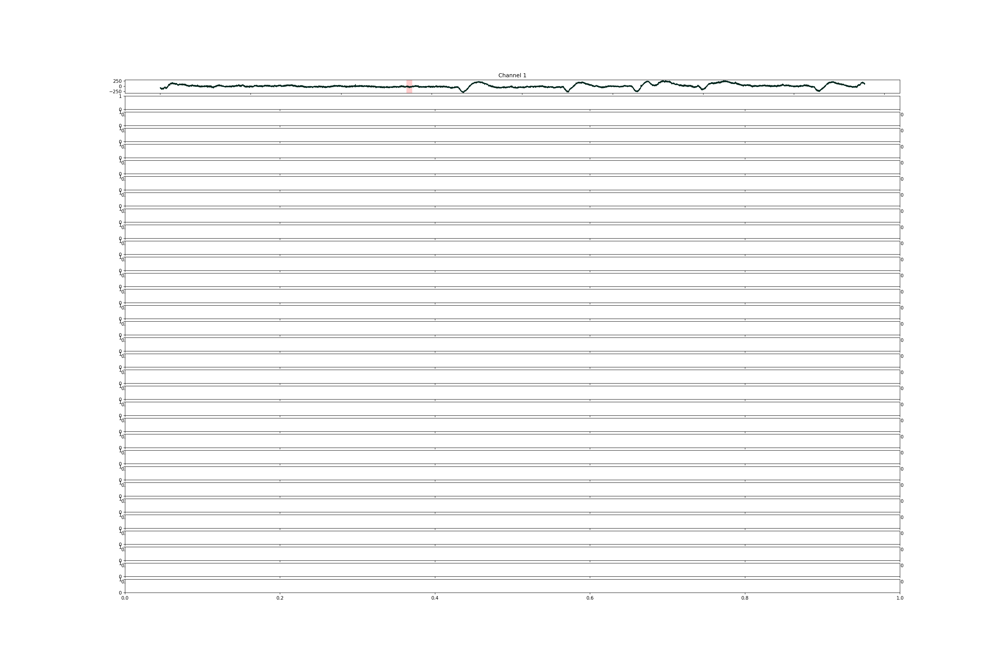

NameError: name 'patches' is not defined

In [60]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.patches as patches

%matplotlib notebook

fig, axs = plt.subplots(nrows=32, figsize=(5,38),sharex=True)
df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv",header=None)

x = df.iloc[0,:128]
lines = []
for i, ax in enumerate(axs):
    
    line, = ax.plot(x,df.iloc[i+1,:128])
    lines.append(line)
    ax.set_ylim(df.iloc[i+1,:].min(), df.iloc[i+1,:].max())

# Set the parameters for the sliding window
window_width = 128
step_size = 100
start_index = 0
end_index = start_index + window_width

# Add the rectangle to the figure
rect = patches.Rectangle((start_index, 0), window_width, 1000, alpha=0.3, facecolor='blue')
fig.patches.append(rect)

def animate(i):
    global start_index, end_index
    start_index = i * step_size
    end_index = start_index + window_width
    
    # Update the lines and the rectangle
    for j ,line in enumerate(lines):
        line.set_xdata(df.iloc[0, start_index:end_index])
        line.set_ydata(df.iloc[j+1, start_index:end_index])
        ax.set_xlim(df.iloc[0, start_index:end_index].min(), df.iloc[0, start_index:end_index].max())
        ax.set_ylim(df.iloc[j+1, start_index:end_index].min(), df.iloc[j+1, start_index:end_index].max())

    rect.set_x(start_index)
    
    return lines + [rect]

ani = animation.FuncAnimation(
    fig, animate, frames=range(0, len(df.iloc[0,:]) - window_width, step_size), interval=1000, blit=True, save_count=500)

plt.show()


C:\Users\a1882\AppData\Local\Temp\ipykernel_15196\238433453.py:9: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  data_32 = data_c.values.astype(np.float)
MovieWriter imagemagick unavailable; using Pillow instead.


KeyboardInterrupt: 

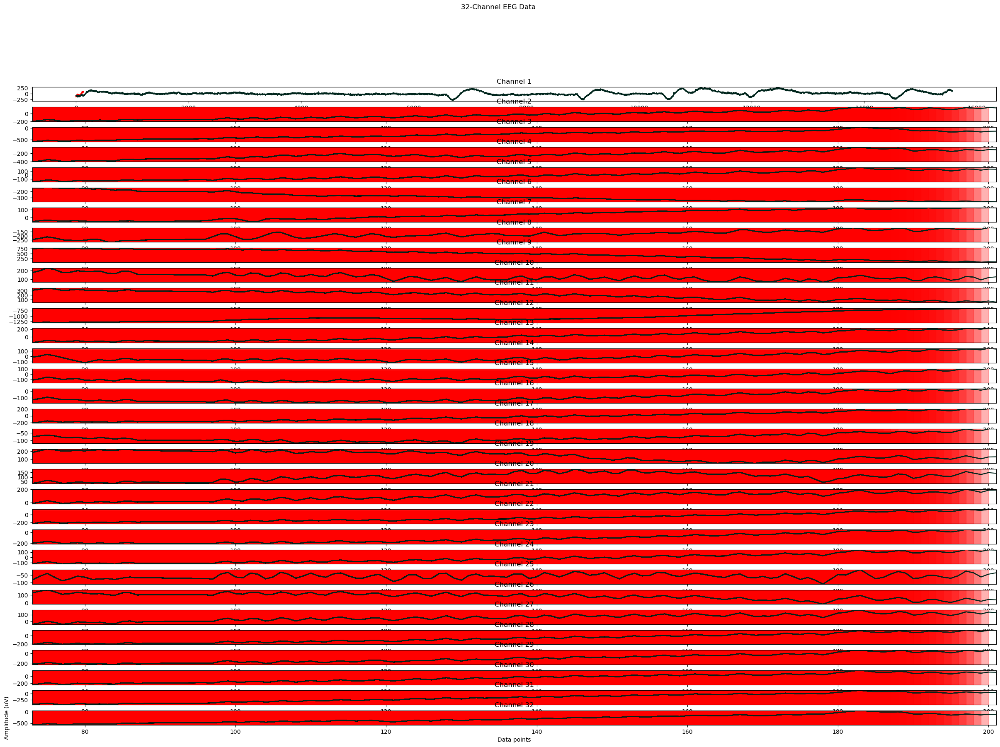

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.animation as animation

# Load the EEG data from CSV file
df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv", header=None)
data_c = df.iloc[1:, 1:]
data_32 = data_c.values.astype(np.float)

# Create a 32-channel EEG plot
fig, axs = plt.subplots(32, figsize=(30, 20))
hex_green = '#00251C'

# Set the window size
win_size = 128

# Create an empty plot for the sliding window
line, = axs[0].plot(np.arange(win_size), data_32[0, :win_size], color='red', lw=2)

# Plot the EEG data for each channel
for i in range(32):
    axs[i].plot(data_32[i, :], color=hex_green)
    axs[i].set_title(f'Channel {i+1}')

# Add title and axis labels
fig.suptitle('32-Channel EEG Data')
plt.xlabel('Data points')
plt.ylabel('Amplitude (uV)')

# Adjust the spacing between subplots
plt.subplots_adjust(hspace=0.4)

# Define the sliding window update function
def update(idx):
    line.set_ydata(data_32[0, idx:idx+win_size])
    for i in range(1, 32):
        axs[i].set_ylim(np.min(data_32[i, idx:idx+win_size]), np.max(data_32[i, idx:idx+win_size]))
        axs[i].set_xlim(idx, idx+win_size)
        axs[i].fill_between(np.arange(idx, idx+win_size), np.min(data_32[i, idx:idx+win_size]), np.max(data_32[i, idx:idx+win_size]), color='red', alpha=0.3)
        axs[i].plot(np.arange(idx,:idx), data_32[i,:idx], color=hex_green)
    return line,

# Animate the sliding window
ani = animation.FuncAnimation(fig, update, frames=data_32.shape[1]-win_size, interval=30, blit=True)

# Save the animation as a GIF file
ani.save('sliding_window.gif', writer='imagemagick')

# Show the EEG plot with the sliding window
plt.show()


<IPython.core.display.Javascript object>


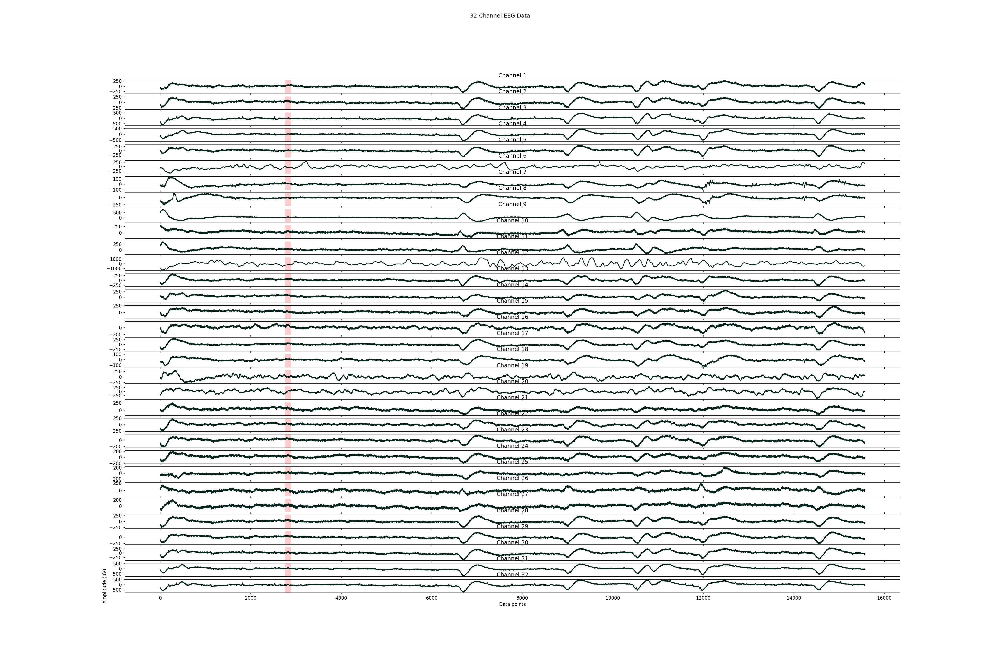

In [64]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Load the data
df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv",header=None)

# Create 32 subplots
fig, axs = plt.subplots(32, figsize=(30, 20))
hex_green = '#00251C'

# Plot each subplot
for i in range(32):
    axs[i].plot(df.iloc[i+1,:], hex_green)
    axs[i].set_title(f'Channel {i+1}')

# Set up the sliding window parameters
window_size = 128
step_size = 64
num_windows = (len(df.columns) - window_size) // step_size

# Define the update function for the animation
def update(i):
    # Clear the previous window highlights
    for j in range(32):
        for patch in axs[j].patches:
            patch.remove()

    # Calculate the indices of the current window
    start_idx = i * step_size
    end_idx = start_idx + window_size
    # Plot a rectangle to highlight the current window for each subplot
    for j in range(32):
        rect = plt.Rectangle((start_idx, axs[j].get_ylim()[0]), window_size, axs[j].get_ylim()[1]-axs[j].get_ylim()[0], alpha=0.2, facecolor='red')
        axs[j].add_patch(rect)

# Set the title and axis labels
fig.suptitle('32-Channel EEG Data')
plt.xlabel('Data points')
plt.ylabel('Amplitude (uV)')

# Create the animation
ani = FuncAnimation(fig, update, frames=num_windows, interval=1000, repeat=False)

# Save the animation as a GIF
ani.save('sliding_window_animation_1.gif', writer='pillow', fps=1)

# Show the plot (this will also run the animation)
plt.show()


<IPython.core.display.Javascript object>


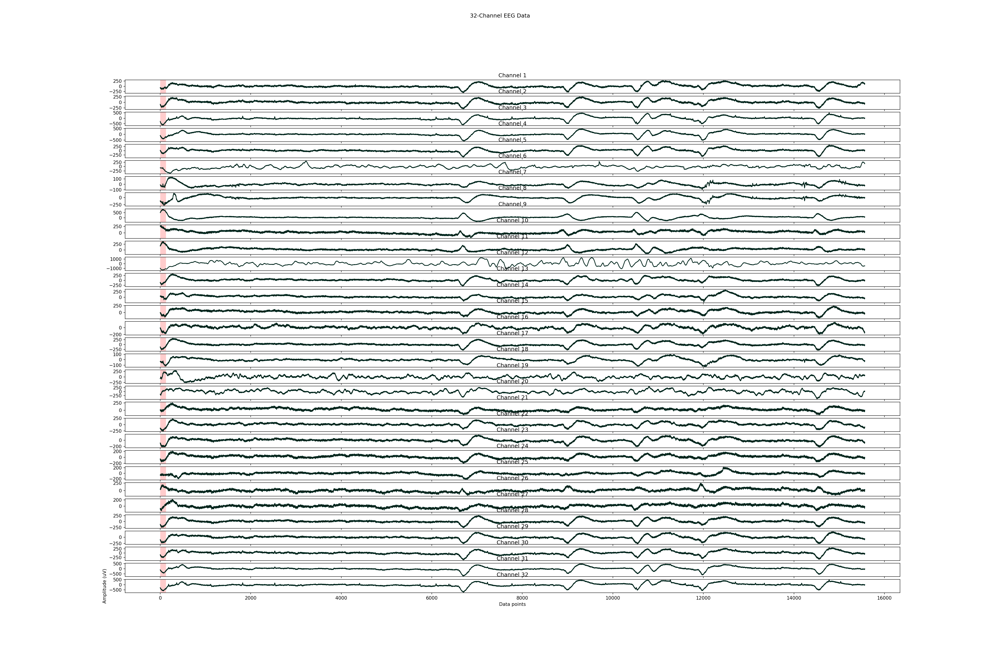

KeyboardInterrupt: 

In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Load the data
df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv",header=None)

# Create 32 subplots
fig, axs = plt.subplots(32, figsize=(30, 20))
hex_green = '#00251C'

# Plot each subplot
for i in range(32):
    axs[i].plot(df.iloc[i+1,:], hex_green)
    axs[i].set_title(f'Channel {i+1}')

# Set up the sliding window parameters
window_size = 128
step_size = 64
num_windows = (len(df.columns) - window_size) // step_size

# Define the update function for the animation
def update(i):
    # Clear the previous window highlights
    for j in range(32):
        for patch in axs[j].patches:
            patch.remove()

    # Calculate the indices of the current window
    start_idx = i * step_size
    end_idx = start_idx + window_size
    # Plot a rectangle to highlight the current window for each subplot
    for j in range(32):
        rect = plt.Rectangle((start_idx, axs[j].get_ylim()[0]), window_size, axs[j].get_ylim()[1]-axs[j].get_ylim()[0], alpha=0.2, facecolor='red')
        axs[j].add_patch(rect)

# Set the title and axis labels
fig.suptitle('32-Channel EEG Data')
plt.xlabel('Data points')
plt.ylabel('Amplitude (uV)')

# Create the animation
ani = FuncAnimation(fig, update, frames=num_windows, interval=1000, repeat=False)

# Save the animation as a GIF
ani.save('sliding_window_animation_30fps.gif', writer='pillow', fps=30)

# Show the plot (this will also run the animation)
plt.show()


<IPython.core.display.Javascript object>


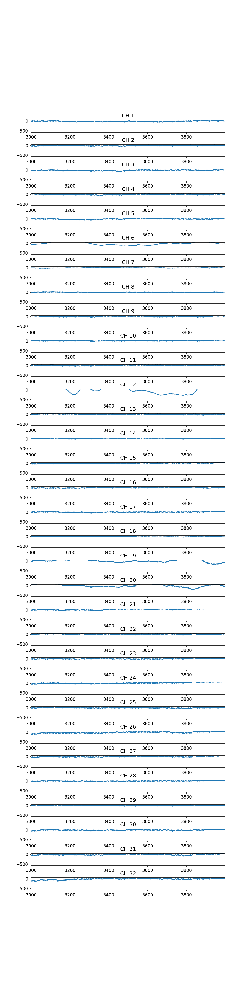

In [85]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
%matplotlib notebook
# %matplotlib agg

fig, axs = plt.subplots(32, figsize=(8, 32))
df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv",header=None)

# 在每个子图中绘制相应的数据，并设置坐标轴范围

for j in range(32):
    axs[j].plot(df.iloc[0,:600], df.iloc[j+1,:600])
    axs[j].set_title(f"CH {j+1}")


# 定义动画函数，更新每个子图的数据
def animate(i):
    for n in range(32):
            axs[n].lines[0].set_data(df.iloc[0,0+i*8:1000+i*8], df.iloc[n+1,0+i*8:1000+i*8])
            axs[n].set_xlim(df.iloc[0, 0+i*8:1000+i*8].min(), df.iloc[0, 0+i*8:1000+i*8].max())
            axs[n].set_ylim(df.iloc[j+1, 0+1*8:1000+i*8].min()+20, df.iloc[j+1, 0+i*8:1000+i*8].max()-20)
    return [line for ax in axs.flat for line in ax.lines]

ani = animation.FuncAnimation(
    fig, animate, interval=1, blit=True, save_count=50)
plt.subplots_adjust(hspace=1)
plt.show()


<IPython.core.display.Javascript object>


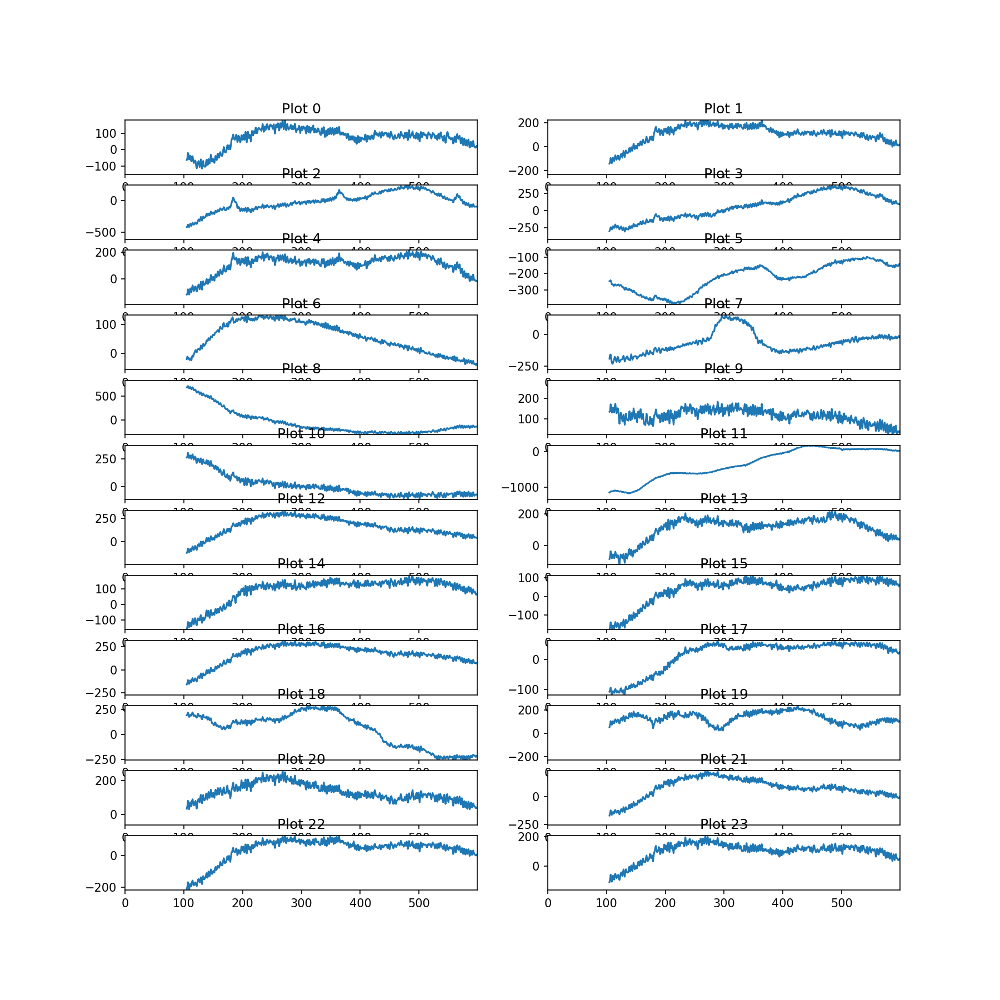

In [60]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
%matplotlib notebook

fig, axs = plt.subplots(12, 2, figsize=(12, 12))
df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv",header=None)

# 在每个子图中绘制相应的数据，并设置坐标轴范围
for i in range(12):
    for j in range(2):
        k = i*2+j
        axs[i, j].plot(df.iloc[0,:600], df.iloc[k+1,:600])
        axs[i, j].set_title(f"Plot {k}")
        axs[i, j].set_xlim(df.iloc[0, :600].min(), df.iloc[0, :600].max())
        axs[i, j].set_ylim(df.iloc[k+1, :600].min(), df.iloc[k+1, :600].max())

# 定义动画函数，更新每个子图的数据
def animate(i):
    for j in range(12):
        for k in range(2):
            n = j*2+k
            axs[j, k].lines[0].set_data(df.iloc[0,0+i:600+i], df.iloc[n+1,0+i:600+i])
    
    return [line for ax in axs.flat for line in ax.lines]

ani = animation.FuncAnimation(
    fig, animate, interval=1, blit=True, save_count=50)

plt.show()


<IPython.core.display.Javascript object>


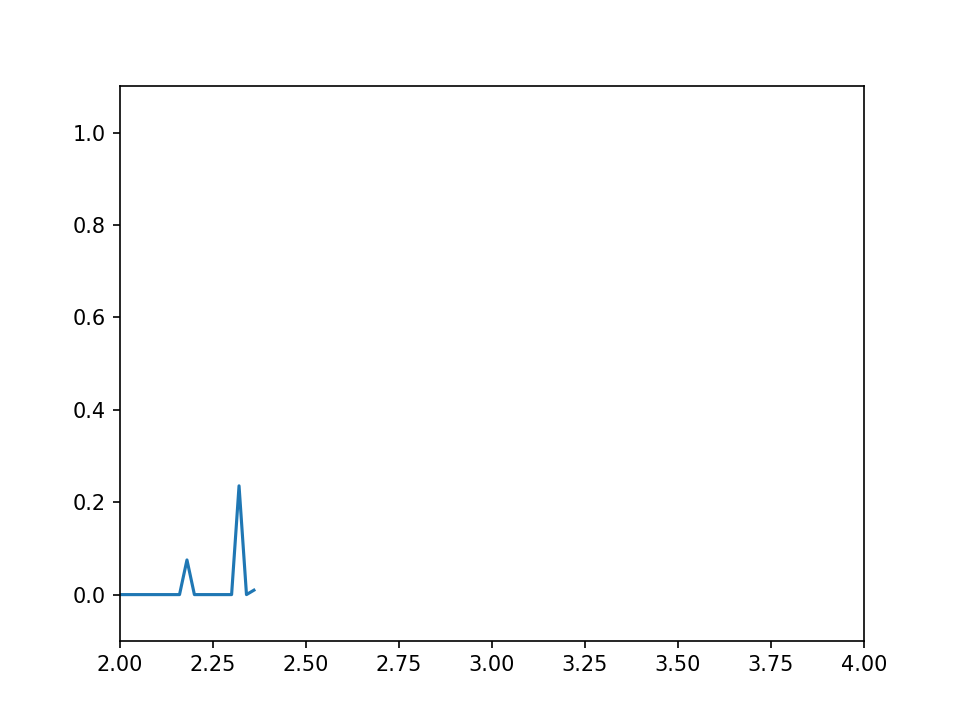

In [4]:
# import numpy as np
# from matplotlib.lines import Line2D
# import matplotlib.pyplot as plt
# import matplotlib.animation as animation


# class Scope:
#     def __init__(self, ax, maxt=2, dt=0.02):
#         self.ax = ax
#         self.dt = dt
#         self.maxt = maxt
#         self.tdata = [0]
#         self.ydata = [0]
#         self.line = Line2D(self.tdata, self.ydata)
#         self.ax.add_line(self.line)
#         self.ax.set_ylim(-.1, 1.1)
#         self.ax.set_xlim(0, self.maxt)

#     def update(self, y):
#         lastt = self.tdata[-1]
#         if lastt >= self.tdata[0] + self.maxt:  # reset the arrays
#             self.tdata = [self.tdata[-1]]
#             self.ydata = [self.ydata[-1]]
#             self.ax.set_xlim(self.tdata[0], self.tdata[0] + self.maxt)
#             self.ax.figure.canvas.draw()

#         # This slightly more complex calculation avoids floating-point issues
#         # from just repeatedly adding `self.dt` to the previous value.
#         t = self.tdata[0] + len(self.tdata) * self.dt

#         self.tdata.append(t)
#         self.ydata.append(y)
#         self.line.set_data(self.tdata, self.ydata)
#         return self.line,


# def emitter(p=0.1):
#     """Return a random value in [0, 1) with probability p, else 0."""
#     while True:
#         v = np.random.rand()
#         if v > p:
#             yield 0.
#         else:
#             yield np.random.rand()


# # Fixing random state for reproducibility
# np.random.seed(19680801 // 10)


# fig, ax = plt.subplots()
# scope = Scope(ax)

# # pass a generator in "emitter" to produce data for the update func
# ani = animation.FuncAnimation(fig, scope.update, emitter, interval=50,
#                               blit=True, save_count=100)

# plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Load the EEG data from CSV file
df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv", header=None)
data_c = df.iloc[1:, 1:]
data_32 = data_c.values.astype(np.float)

# Create a 32-channel EEG plot
fig, axs = plt.subplots(32, figsize=(30, 20))
hex_green = '#00251C'

# Set the window size
win_size = 128

# Create an empty plot for the sliding window
line, = axs[0].plot(np.arange(win_size), data_32[0, :win_size], color='red', lw=2)

# Plot the EEG data for each channel
for i in range(32):
    axs[i].plot(data_32[i, :], color=hex_green)
    axs[i].set_title(f'Channel {i+1}')

# Add title and axis labels
fig.suptitle('32-Channel EEG Data')
plt.xlabel('Data points')
plt.ylabel('Amplitude (uV)')

# Adjust the spacing between subplots
plt.subplots_adjust(hspace=0.4)

# Define the sliding window update function
def update(idx):
    line.set_ydata(data_32[0, idx:idx+win_size])
    for i in range(1, 32):
        axs[i].set_ylim(np.min(data_32[i, idx:idx+win_size]), np.max(data_32[i, idx:idx+win_size]))
        axs[i].set_xlim(idx, idx+win_size)
        axs[i].fill_between(np.arange(idx, idx+win_size), np.min(data_32[i, idx:idx+win_size]), np.max(data_32[i, idx:idx+win_size]), color='red', alpha=0.3)
        axs[i].plot(np.arange(idx, idx+win_size), data_32[i, idx:idx+win_size], color=hex_green)
    return line,

# Animate the sliding window
ani = animation.FuncAnimation(fig, update, frames=data_32.shape[1]-win_size, interval=30, blit=True)

# Save the animation as a GIF file
ani.save('sliding_window.gif', writer='imagemagick')

# Show the EEG plot with the sliding window
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.animation as animation
# Load the EEG data from CSV file
df = pd.read_csv("C:\\Users\\a1882\\Desktop\\EEG\\new_implement\\data\\origin_raw_data\\lefthand_zyy_04_epocflex_2023.03.22t16.48.29+08.00.md.bp.csv", header=None)
data_c = df.iloc[1:, 1:]
data_32 = data_c.values.astype(np.float)

# Create a 32-channel EEG plot
fig, axs = plt.subplots(32, figsize=(30, 20),facecolor='none')
hex_green = '#00251C'

# Set the window size
win_size = 128

# Create an empty plot for the sliding window
line, = axs[0].plot(np.arange(win_size), data_32[0, :win_size], color='red', lw=2)

# Plot the EEG data for each channel
for i in range(32):
    axs[i].plot(data_32[i, :], color=hex_green)
    axs[i].set_title(f'Channel {i+1}')

# Add title and axis labels
fig.suptitle('32-Channel EEG Data')
plt.xlabel('Data points')
plt.ylabel('Amplitude (uV)')

# Adjust the spacing between subplots
plt.subplots_adjust(hspace=0.4)

# Define the sliding window update function
def update(idx):
    line.set_ydata(data_32[0, idx:idx+win_size])
    for i in range(32):
        axs[i].set_ylim(np.min(data_32[i, idx:idx+win_size]), np.max(data_32[i, idx:idx+win_size]))
        axs[i].set_xlim(idx, idx+win_size)
        axs[i].fill_between(np.arange(idx, idx+win_size), np.min(data_32[i, idx:idx+win_size]), np.max(data_32[i, idx:idx+win_size]), color='red', alpha=0.3)
        axs[i].plot(np.arange(idx, idx+win_size), data_32[i, idx:idx+win_size], color=hex_green)
    return line,

# Animate the sliding window
ani = animation.FuncAnimation(fig, update, frames=data_32.shape[1]-win_size, interval=1000/128, blit=True)

writer = animation.PillowWriter(metadata={'background': 'transparent'})
# Save the animation as a GIF file
ani.save('sliding_window_realtime1.gif', writer=writer)

# Show the EEG plot with the sliding window
plt.show()

C:\Users\a1882\AppData\Local\Temp\ipykernel_20088\2659804911.py:8: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  data_32 = data_c.values.astype(np.float)
